# The goal of this notebook is to test the drift mechanism on changes in noise. 

### Test design
**Data** 
use a single image from the dataset. NAME=HYPSO-1_HSI_20220824T101456Z-l1a.nc\
*Trainingdata* = first fifty rows (50*684=34,200 pixels)\
*Testdata* = remaining rows ((956-50)*684=647,064 pixels), at every row, the noise level across the target bands = [10, 11, 12, 70, 106, 107] is increased\

**Models**
ALL models used q=5 dimensions for a fair comparison, and they are:
- PCA 
- Static MFA trained 
- OMFA without sEM
- OAMFA

**Test**
Transpose the image and stream one line at a time. In this manner the x-axis allso represents time.\
For each line: 
1) Project each pixel to the latent space using all the models. 
2) Calculate the RMSE and SAM from the latent variable to the real variable
3) Perform the assingment 

**Syntetic Noise**
To accurately model cumulative CCD degradation, we inject targeted, wavelength-dependent Gaussian noise into the data stream. The variance of this noise scales linearly with time (represented by the push-broom row index, $t$).\
For a given pixel at time $t$ and specific targeted band $b$, the degraded radiance signal $\tilde{x}_{b,t}$ is defined as: $$\tilde{x}_{b,t} = x_{b,t} + \mathcal{N}(0, \sigma_{b,t}^2)$$ Where the time-dependent variance $\sigma_{b,t}^2$ is calculated as: $$\sigma_{b,t}^2 = \sigma_{base}^2 \cdot \left( \frac{t}{T} \cdot v_{max} \right)$$ $x_{b,t}$ is the original clean radiance. $\sigma_{base}^2$ is the global base variance of the hyperspectral cube. $T$ is the total number of push-broom rows in the simulation. $v_{max}$ is the maximum variance multiplier reached at the end of the sweep.

**Plot**
A figure containing multiple rows: 
1) The true image in rgb, where a dotted line markes what data was used for pretraining
2) A RMSE graph as a function of number of lines, it should include a legend
3) A SAM graph as a function of number of lines, it should include a legend
4) The next rows contains a heatmap for each model where the SAM of a given pixel determines the heat 
5) Plot some averages for the different arameters, e.g average noise as as a function of t or my as a function of t


In [1]:
import sys
import os
import numpy as np
import matplotlib.pyplot as plt
import torch
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from utils import get_rgb, calculate_sam, reconstruct_mfa
import copy
import time
import matplotlib.patches as mpatches
from matplotlib.lines import Line2D
from matplotlib.colors import Normalize

parent_dir = os.path.abspath('..')
if parent_dir not in sys.path:
    sys.path.insert(0, parent_dir)

from otfp import MFA_OTFP
from hypso import Hypso


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

L2_NORMALIZATION = True  # Set to True to enable L2 normalization, False to disable

Loading baseline hypercube from ../data/component_drift/trondheim_2022-08-24T10-14-56Z-l1b.nc...
Successfully loaded | Shape: (956, 684, 120)

--- Split Summary ---
Training Rows:  10 -> Shape: (10, 684, 120)
Testing Rows:   946 -> Shape: (946, 684, 120)

Applying simulated sensor degradation to test partition...
Target Bands: [10, 11, 12, 70, 106, 107]


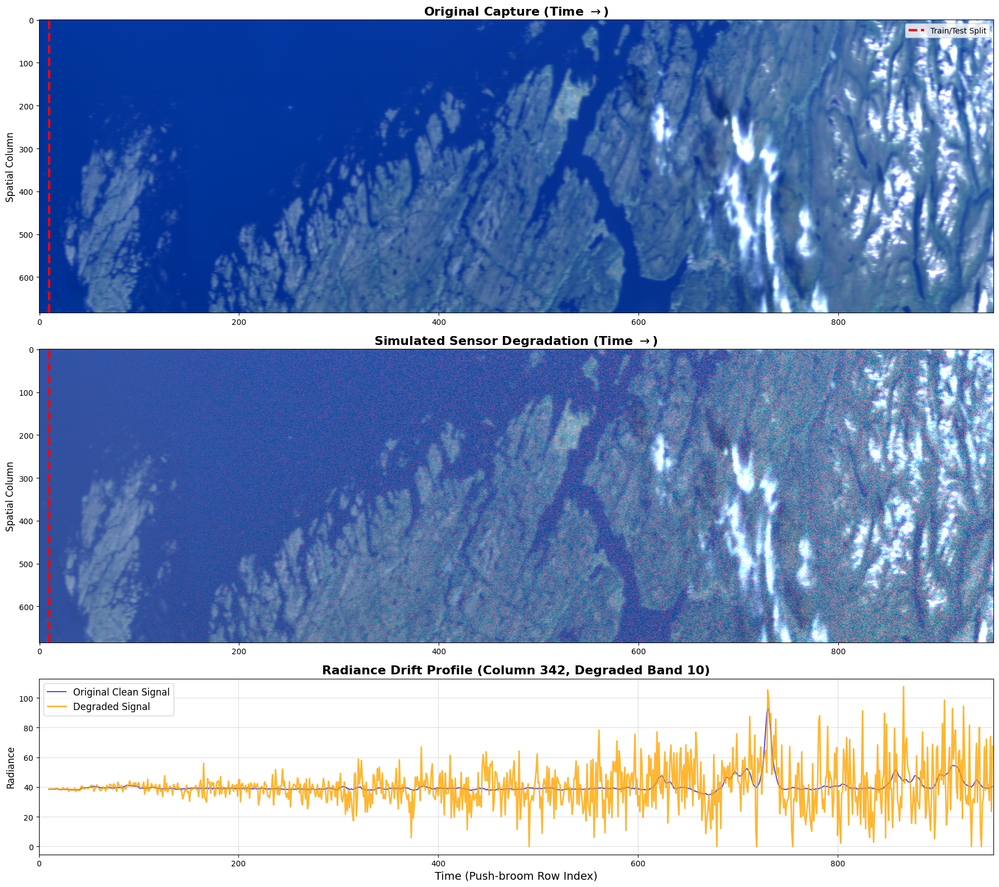

In [2]:
DATA_PATH = "../data/component_drift/trondheim_2022-08-24T10-14-56Z-l1b.nc" #Works well
N_TRAIN_ROWS = 10
BANDS_TO_DEGRADE = [10, 11, 12, 70, 106, 107] # Edges of the sensor, prone to radiation degradation
MAX_NOISE_VARIANCE = 1.5

# --- 1. Load Data ---
print(f"Loading baseline hypercube from {DATA_PATH}...")
try:
    satobj = Hypso(DATA_PATH)
    cube = getattr(satobj, "l1b_cube", None)
    if cube is None:
        raise ValueError("Missing 'l1b_cube' data.")
    
    img_full = cube.values.astype(np.float32)
    print(f"Successfully loaded | Shape: {img_full.shape}")
except Exception as e:
    print(f"FATAL: Error processing {DATA_PATH}: {e}")
    sys.exit()

# --- 2. Split Data ---
img_train = img_full[:N_TRAIN_ROWS, :, :].copy()
img_test_base = img_full[N_TRAIN_ROWS:, :, :].copy()

total_test_rows = img_test_base.shape[0]
print(f"\n--- Split Summary ---")
print(f"Training Rows:  {N_TRAIN_ROWS} -> Shape: {img_train.shape}")
print(f"Testing Rows:   {total_test_rows} -> Shape: {img_test_base.shape}")

# --- 3. Define Sensor Degradation Function ---
def degrade_sensor_signal(img_cube, target_bands, max_variance):
    """
    Simulates cumulative sensor degradation by injecting targeted, 
    wavelength-specific noise that scales linearly with the sensor sweep (time).
    """
    degraded_cube = img_cube.copy()
    n_rows, n_cols, n_bands = degraded_cube.shape
    
    # Calculate a global base standard deviation to scale the noise appropriately
    base_std = np.nanstd(img_cube)
    
    # Generate linearly increasing variance weights: 0.0 at row 0 -> max_variance at row N
    variance_weights = np.linspace(0, max_variance, n_rows)
    
    np.random.seed(42) # For reproducibility
    
    for row_idx in range(n_rows):
        current_variance = variance_weights[row_idx]
        
        # We only want to degrade specific bands, mimicking specific CCD detector damage
        for b in target_bands:
            noise = np.random.normal(
                loc=0.0, 
                scale=base_std * current_variance, 
                size=(n_cols,)
            )
            degraded_cube[row_idx, :, b] += noise
            
    # Clip to physical sensor boundaries
    return np.clip(degraded_cube, 0, np.nanmax(img_cube))

# --- 4. Apply Degradation for Visualization ---
print(f"\nApplying simulated sensor degradation to test partition...")
print(f"Target Bands: {BANDS_TO_DEGRADE}")
img_test_degraded = degrade_sensor_signal(img_test_base, BANDS_TO_DEGRADE, MAX_NOISE_VARIANCE)

# Combine for plotting
img_full_degraded = np.concatenate((img_train, img_test_degraded), axis=0)

# --- 5. Plotting the Experimental Setup (TRANSPOSED & SCALED) ---
# We use gridspec_kw to make the images taller (ratio 1) and the line plot shorter (ratio 0.6)
fig, axes = plt.subplots(3, 1, figsize=(18, 16), gridspec_kw={'height_ratios': [1, 1, 0.6]}) 

# Helper to transpose RGB for plotting (Time on X-axis, Spatial Column on Y-axis)
def transpose_for_time_x(hsi_cube):
    return np.transpose(get_rgb(hsi_cube), (1, 0, 2))

# 5a. Original Image
# ADDED: aspect='auto' to stretch the image to fill the layout
axes[0].imshow(transpose_for_time_x(img_full), aspect='auto')
axes[0].set_title("Original Capture (Time $\\rightarrow$)", fontsize=16, fontweight='bold')
axes[0].axvline(x=N_TRAIN_ROWS, color='red', linestyle='--', linewidth=3, label="Train/Test Split")
axes[0].set_ylabel("Spatial Column", fontsize=12)
axes[0].legend(loc="upper right")

# 5b. Degraded Image
axes[1].imshow(transpose_for_time_x(img_full_degraded), aspect='auto')
axes[1].set_title("Simulated Sensor Degradation (Time $\\rightarrow$)", fontsize=16, fontweight='bold')
axes[1].axvline(x=N_TRAIN_ROWS, color='red', linestyle='--', linewidth=3)
axes[1].set_ylabel("Spatial Column", fontsize=12)

# 5c. Spectral Drift Proof
target_col = img_full.shape[1] // 2
target_band = BANDS_TO_DEGRADE[0]

# The x-axis array for plotting (starting after the training rows)
x_time = np.arange(N_TRAIN_ROWS, N_TRAIN_ROWS + total_test_rows)

axes[2].plot(x_time, img_full[N_TRAIN_ROWS:, target_col, target_band], label="Original Clean Signal", color='blue', alpha=0.7)
axes[2].plot(x_time, img_test_degraded[:, target_col, target_band], label="Degraded Signal", color='orange', alpha=0.8, linewidth=2)
axes[2].set_title(f"Radiance Drift Profile (Column {target_col}, Degraded Band {target_band})", fontsize=16, fontweight='bold')
axes[2].set_xlabel("Time (Push-broom Row Index)", fontsize=14)
axes[2].set_ylabel("Radiance", fontsize=12)
axes[2].legend(loc="upper left", fontsize=12)
axes[2].grid(True, alpha=0.4)
axes[2].set_xlim(0, N_TRAIN_ROWS + total_test_rows) 

plt.tight_layout()
plt.show()

# Clean up memory
del img_full_degraded

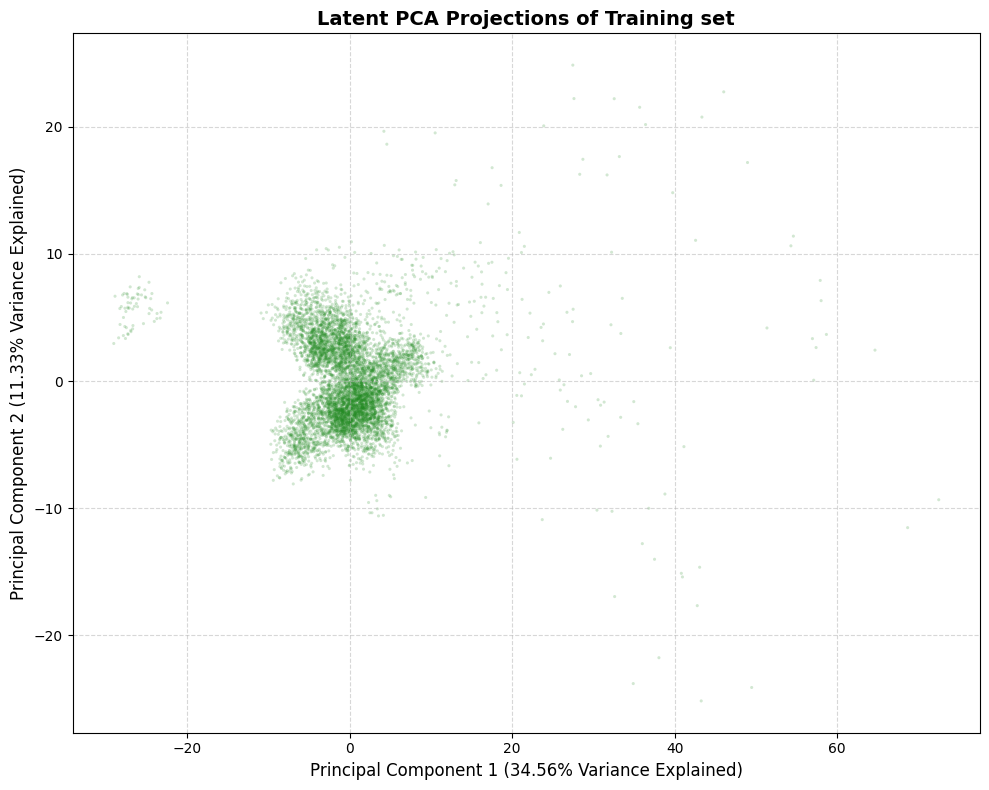

In [3]:
# Forrest-patch is fetched from the above cell

h, w, bands = img_train.shape
num_pixels = h * w

# Flatten from 3D (128, 128, B) to 2D (16384, B)
flattened_pixels = img_train.reshape(num_pixels, bands)

if L2_NORMALIZATION:
    # Optional: L2 normalize each pixel vector to focus on spectral shape rather than magnitude
    norms = np.linalg.norm(flattened_pixels, axis=1, keepdims=True) + 1e-10  # Avoid division by zero
    flattened_pixels = flattened_pixels / norms

# Optional but recommended: Standardize the features (bands)
# This ensures bands with larger numerical ranges don't dominate the PCA
scaler = StandardScaler()
scaled_pixels = scaler.fit_transform(flattened_pixels)

# --- 2. Fit the PCA model ---
# We only need 2 components for a 2D scatter plot
pca = PCA(n_components=2)
latent_projections = pca.fit_transform(scaled_pixels)

# --- 3. Extract Explained Variance ---
# Convert the ratios to percentages for the plot labels
explained_variance = pca.explained_variance_ratio_ * 100
var_pc1 = explained_variance[0]
var_pc2 = explained_variance[1]

# --- 4. Plot the Latent Projections ---
plt.figure(figsize=(10, 8))

# Using a low 'alpha' (transparency) is crucial here. 
# You are plotting 16,384 points, and they will overplot into a solid blob otherwise.
plt.scatter(
    latent_projections[:, 0], 
    latent_projections[:, 1], 
    alpha=0.2,   # Transparency to see density
    s=5,         # Small dot size
    c='forestgreen',
    edgecolors='none'
)

# Labeling with the captured variance
plt.xlabel(f'Principal Component 1 ({var_pc1:.2f}% Variance Explained)', fontsize=12)
plt.ylabel(f'Principal Component 2 ({var_pc2:.2f}% Variance Explained)', fontsize=12)
plt.title('Latent PCA Projections of Training set', fontsize=14, fontweight='bold')

plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

### Training the models

In [4]:
# Your original code:
img_train = img_train.reshape(-1, img_train.shape[-1])  # Flatten to (num_pixels, num_bands)
img_train = torch.from_numpy(img_train).float().to(device)  # Convert to PyTorch tensor

MFA_OTFP_model=MFA_OTFP(
    n_channels=120, 
    device="cpu", 
    outlier_update_treshold=100,
    q_max=4,
    L2_normalization=L2_NORMALIZATION
)

MFA_OTFP_model.fit(img_train)

Model successfully updated! Added 1 components. Total (K) is now 1


### Streaming the different models: Static MFA, Online MFA and Adaptive Online MFA

In [5]:
print("--- INITIALIZING SENSOR DEGRADATION TEST ---")

# --- 1. Initialize Baseline Models ---
print("Deepcopying the pretrained MFA model into test variants...")
offline_MFA = copy.deepcopy(MFA_OTFP_model)
offline_MFA.MFA.eval()
online_MFA = copy.deepcopy(MFA_OTFP_model)
adaptive_online_MFA = copy.deepcopy(MFA_OTFP_model)

print("Fitting PCA Baseline on training data...")
img_train_flat = img_train.reshape(-1, img_train.shape[-1])
if isinstance(img_train_flat, torch.Tensor):
    img_train_tensor = img_train_flat.float()
else:
    img_train_tensor = torch.from_numpy(img_train_flat).float()

# PCA always gets raw data (it mean-centers internally)
pca_baseline = PCA(n_components=4)
pca_baseline.fit(img_train_tensor.cpu().numpy())

# --- 2. Initialize Tracking Structures ---
h, w, d = img_test_degraded.shape
device = adaptive_online_MFA.device 

# CRITICAL FIX: Dynamically check what the model expects 
print(f"MFA L2 Normalization is set to: {L2_NORMALIZATION}")

metrics = {
    "PCA": { "sam": []},
    "Static_MFA": { "sam": []},
    "Online_MFA": { "sam": []},
    "OAMFA": { "sam": []}
}

mu_history = {0: [], 1: [], 2: []}
psi_history = {0: [], 1: [], 2: []}
time_steps = []     
target_band_idx = 10      

assignment_omfa_map = np.zeros((h, w))
assignment_oamfa_map = np.zeros((h, w))
mahalanobis_map = np.zeros((h, w))

baseline_k = adaptive_online_MFA.MFA.K
current_k = baseline_k
spawn_rows = []

BATCH_SIZE = 1  
print(f"Streaming hyperspectral data in batches of {BATCH_SIZE}...")
start_time = time.time()

# --- 3. The Streaming Loop ---
for t_row in range(0, h, BATCH_SIZE):
    end_row = min(t_row + BATCH_SIZE, h)
    actual_batch_size = end_row - t_row
    
    slice_data = img_test_degraded[t_row : end_row, :, :]
    batch_flat = slice_data.reshape(-1, d)
    X_batch = torch.tensor(batch_flat, dtype=torch.float32).to(device)
    
    # Create the conditional input for the raw MFA helpers
    if L2_NORMALIZATION:
        X_mfa_truth = torch.nn.functional.normalize(X_batch, p=2, dim=1)
    else:
        X_mfa_truth = X_batch # Keep it raw

    # PCA Evaluations (Always raw)
    z_pca = pca_baseline.transform(X_batch.cpu().numpy())
    X_rec_pca = torch.tensor(pca_baseline.inverse_transform(z_pca), dtype=torch.float32).to(device)
    
    # MFA Evaluations 
    assignments_omfa, _, _ = online_MFA.process_data_block(X=X_batch, stepwise_updates=False)
    assignments_oamfa, distances, _ = adaptive_online_MFA.process_data_block(X=X_batch, stepwise_updates=True)
    
    # reconstruct_mfa gets X_mfa_truth because it talks to the inner PyTorch model directly
    X_rec_static, _ = reconstruct_mfa(offline_MFA.MFA, X_mfa_truth)
    X_rec_online, _ = reconstruct_mfa(online_MFA.MFA, X_mfa_truth)
    X_rec_oamfa, _ = reconstruct_mfa(adaptive_online_MFA.MFA, X_mfa_truth)

    # 4. Spatial Un-batching & Row-by-Row Metric Logging 
    X_raw_3d = X_batch.view(actual_batch_size, w, d) 
    X_mfa_truth_3d = X_mfa_truth.view(actual_batch_size, w, d) # The correct ground truth
    
    X_rec_pca_3d = X_rec_pca.view(actual_batch_size, w, d)
    X_rec_static_3d = X_rec_static.view(actual_batch_size, w, d)
    X_rec_online_3d = X_rec_online.view(actual_batch_size, w, d)
    X_rec_oamfa_3d = X_rec_oamfa.view(actual_batch_size, w, d)

    current_psi_trace = torch.sum(torch.exp(adaptive_online_MFA.MFA.log_psi[0])).item()
    current_mu_val = adaptive_online_MFA.MFA.mu[0, target_band_idx].item()

    for b in range(actual_batch_size):
        # PCA is evaluated against the RAW 3D batch
        metrics["PCA"]["sam"].append(calculate_sam(X_raw_3d[b], X_rec_pca_3d[b]))
        
        # MFA is evaluated against the CONDITIONAL truth (Raw or L2 depending on the flag)
        metrics["Static_MFA"]["sam"].append(calculate_sam(X_mfa_truth_3d[b], X_rec_static_3d[b])) 
        metrics["Online_MFA"]["sam"].append(calculate_sam(X_mfa_truth_3d[b], X_rec_online_3d[b]))
        metrics["OAMFA"]["sam"].append(calculate_sam(X_mfa_truth_3d[b], X_rec_oamfa_3d[b]))
        
       # Track the mean and variance over time
        current_line_idx = t_row + b
        time_steps.append(current_line_idx)
        
        # Get the current number of active components
        active_k = adaptive_online_MFA.MFA.mu.shape[0]

        for comp_idx in [0, 1, 2]:
            if comp_idx < active_k:
                # --- COMPONENT EXISTS: Extract localized parameters ---
                current_mu_val = adaptive_online_MFA.MFA.mu[comp_idx, target_band_idx].item()
                
                # Directly extract from the component's unique noise row
                current_psi_val = torch.exp(adaptive_online_MFA.MFA.log_psi[comp_idx, target_band_idx]).item()
            else:
                # --- COMPONENT NOT YET SPAWNED: Pad with NaNs ---
                current_mu_val = float('nan')
                current_psi_val = float('nan')

            # Append to history
            mu_history[comp_idx].append(current_mu_val)
            psi_history[comp_idx].append(current_psi_val)

    # --- 5. Map 2D Heatmaps and Track Spawns ---
    assign_omfa_np = assignments_omfa.cpu().numpy().copy()
    assign_oamfa_np = assignments_oamfa.cpu().numpy().copy()
    dist_np = distances.cpu().numpy()
    

    assignment_omfa_map[t_row : end_row, :] = assign_omfa_np.reshape(actual_batch_size, w)
    assignment_oamfa_map[t_row : end_row, :] = assign_oamfa_np.reshape(actual_batch_size, w)
    mahalanobis_map[t_row : end_row, :] = dist_np.reshape(actual_batch_size, w)
    
    if adaptive_online_MFA.MFA.K > current_k:
        spawn_rows.append(t_row)
        current_k = adaptive_online_MFA.MFA.K

    if t_row % 100 == 0 and t_row > 0:
        print(f"Processed {t_row}/{h} rows...")

print("\n--- STREAMING COMPLETE ---")
print(f"Total processing time: {time.time() - start_time:.2f} seconds")

--- INITIALIZING SENSOR DEGRADATION TEST ---
Deepcopying the pretrained MFA model into test variants...
Fitting PCA Baseline on training data...
MFA L2 Normalization is set to: True
Streaming hyperspectral data in batches of 1...
Model successfully updated! Added 1 components. Total (K) is now 2
Model successfully updated! Added 1 components. Total (K) is now 2
Model successfully updated! Added 1 components. Total (K) is now 3
Model successfully updated! Added 1 components. Total (K) is now 3
Model successfully updated! Added 1 components. Total (K) is now 4
Processed 100/946 rows...
Model successfully updated! Added 1 components. Total (K) is now 5
Processed 200/946 rows...
Processed 300/946 rows...
Processed 400/946 rows...
Processed 500/946 rows...
Processed 600/946 rows...
Processed 700/946 rows...
Processed 800/946 rows...
Processed 900/946 rows...

--- STREAMING COMPLETE ---
Total processing time: 29.82 seconds


### Plotting 

--- GENERATING MASTER THESIS FIGURE ---


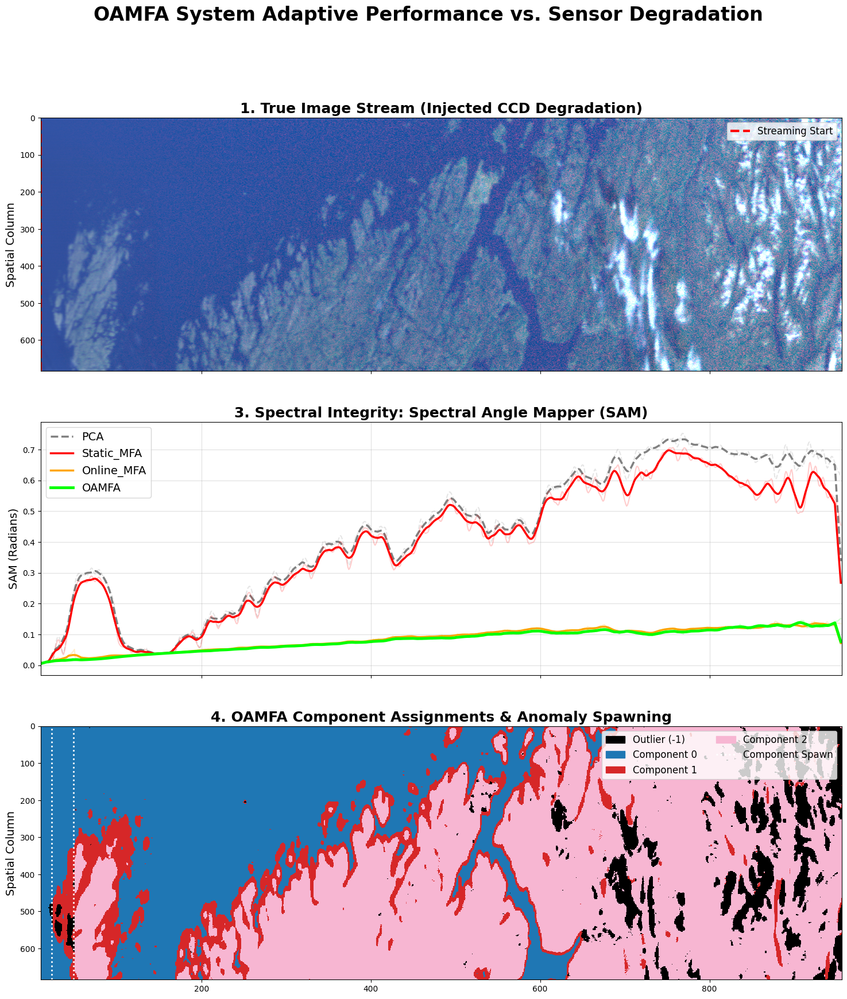

In [6]:
print("--- GENERATING MASTER THESIS FIGURE ---")

# --- 1. Preparation & Helpers ---
# FIX: Pull the pristine 3D training data directly from img_full to avoid flattened 2D errors
img_train_3d = img_full[:N_TRAIN_ROWS, :, :]
img_full_degraded = np.concatenate((img_train_3d, img_test_degraded), axis=0)

# The absolute timeline for the x-axis
time_steps = np.arange(N_TRAIN_ROWS, N_TRAIN_ROWS + h)

def transpose_for_time_x(hsi_cube):
    """Swaps spatial dimensions so Time (Rows) is on the X-axis for RGB."""
    return np.transpose(get_rgb(hsi_cube), (1, 0, 2))

def smooth_curve(y, window=15):
    """Calculates a moving average to smooth noisy row-by-row metrics."""
    box = np.ones(window) / window
    # Use 'valid' to avoid edge artifacts, then pad to match length
    smoothed = np.convolve(y, box, mode='same')
    return smoothed

# --- 2. Figure Setup ---
# sharex=True locks the time axis across all plots!
fig, axes = plt.subplots(3, 1, figsize=(18, 19.5), sharex=True, 
                         gridspec_kw={'height_ratios': [1, 1, 1]})

fig.suptitle("OAMFA System Adaptive Performance vs. Sensor Degradation", 
             fontsize=24, fontweight='bold', y=0.98)

# ==========================================
# PLOT 1: True RGB Timeline
# ==========================================
axes[0].imshow(transpose_for_time_x(img_full_degraded), aspect='auto')
axes[0].set_title(r"1. True Image Stream (Injected CCD Degradation)", fontsize=18, fontweight='bold')
axes[0].axvline(x=N_TRAIN_ROWS, color='red', linestyle='--', linewidth=3, label="Streaming Start")
axes[0].set_ylabel("Spatial Column", fontsize=14)
axes[0].legend(loc="upper right", fontsize=12)

models = [
    ("PCA", "gray", "--"), 
    ("Static_MFA", "red", "-"), 
    ("Online_MFA", "orange", "-"), 
    ("OAMFA", "lime", "-")
]

# ==========================================
# PLOT 2: Spectral Angle Mapper (SAM)
# ==========================================
axes[1].set_title(r"3. Spectral Integrity: Spectral Angle Mapper (SAM)", fontsize=18, fontweight='bold')
for model_name, color, style in models:
    raw_sam = metrics[model_name]["sam"]
    smoothed_sam = smooth_curve(raw_sam)
    
    axes[1].plot(time_steps, raw_sam, color=color, linestyle=style, alpha=0.2)
    lw = 3.5 if model_name == "OAMFA" else 2.5
    axes[1].plot(time_steps, smoothed_sam, color=color, linestyle=style, linewidth=lw, label=model_name)

axes[1].set_ylabel("SAM (Radians)", fontsize=14)
axes[1].legend(loc="upper left", fontsize=14)
axes[1].grid(True, alpha=0.4)

# ==========================================
# PLOT 3: OAMFA Component Assignments & Custom Legend
# ==========================================
axes[2].set_title(r"4. OAMFA Component Assignments & Anomaly Spawning", fontsize=18, fontweight='bold')

cmap = copy.copy(plt.get_cmap("tab20"))
cmap.set_under("black") # Force outliers (-1) to black

final_k = adaptive_online_MFA.MFA.K
color_norm = Normalize(vmin=0, vmax=final_k) # Used to fetch exact colors for the legend

im = axes[2].imshow(assignment_oamfa_map.T, aspect='auto', cmap=cmap, vmin=0, vmax=final_k,
                    extent=[N_TRAIN_ROWS, N_TRAIN_ROWS + h, w, 0], interpolation='nearest')

# Draw the vertical spawn lines
for sr in spawn_rows:
    axes[2].axvline(x=N_TRAIN_ROWS + sr, color='white', linestyle=':', linewidth=2)

axes[2].set_ylabel("Spatial Column", fontsize=14)

# --- Construct the Custom Legend ---
legend_elements = []

# 1. Add the Outlier category
legend_elements.append(mpatches.Patch(color='black', label='Outlier (-1)'))

# 2. Add dynamically generated Component categories
for k in range(final_k):
    comp_color = cmap(color_norm(k))
    legend_elements.append(mpatches.Patch(color=comp_color, label=f'Component {k}'))

# 3. Add the Spawn Line marker
if len(spawn_rows) > 0:
    legend_elements.append(Line2D([0], [0], color='white', linestyle=':', linewidth=2, label='Component Spawn'))

# Plot the legend (ncol=2 splits it into two columns to save space)
axes[2].legend(handles=legend_elements, loc="upper right", fontsize=12, ncol=2)


### Plots for rapport

--- GENERATING MASTER THESIS FIGURE ---


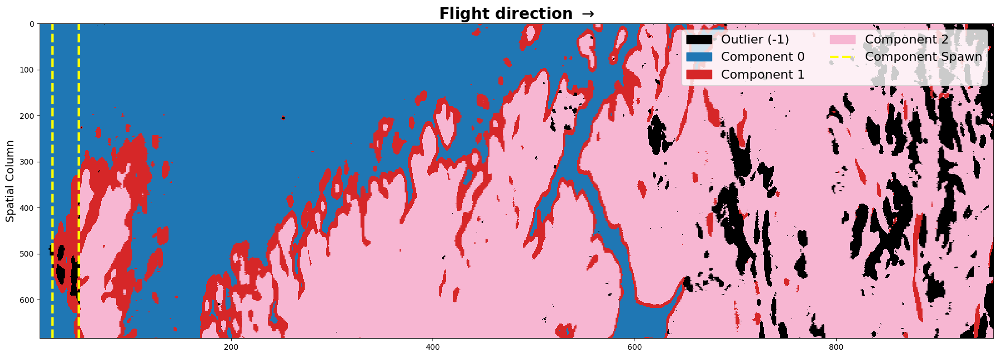

In [7]:
print("--- GENERATING MASTER THESIS FIGURE ---")

# --- 1. Preparation & Helpers ---
# FIX: Pull the pristine 3D training data directly from img_full to avoid flattened 2D errors
img_train_3d = img_full[:N_TRAIN_ROWS, :, :]
img_full_degraded = np.concatenate((img_train_3d, img_test_degraded), axis=0)

# The absolute timeline for the x-axis
time_steps = np.arange(N_TRAIN_ROWS, N_TRAIN_ROWS + h)

def transpose_for_time_x(hsi_cube):
    """Swaps spatial dimensions so Time (Rows) is on the X-axis for RGB."""
    return np.transpose(get_rgb(hsi_cube), (1, 0, 2))

def smooth_curve(y, window=15):
    """Calculates a moving average to smooth noisy row-by-row metrics."""
    box = np.ones(window) / window
    # Use 'valid' to avoid edge artifacts, then pad to match length
    smoothed = np.convolve(y, box, mode='same')
    return smoothed

# sharex=True locks the time axis across all plots!
fig, axes = plt.subplots(1, 1, figsize=(18, 6.5), sharex=True)

cmap = copy.copy(plt.get_cmap("tab20"))
cmap.set_under("black") # Force outliers (-1) to black

final_k = adaptive_online_MFA.MFA.K
color_norm = Normalize(vmin=0, vmax=final_k) # Used to fetch exact colors for the legend

im = axes.imshow(assignment_oamfa_map.T, aspect='auto', cmap=cmap, vmin=0, vmax=final_k,
                    extent=[N_TRAIN_ROWS, N_TRAIN_ROWS + h, w, 0], interpolation='nearest')

# Draw the vertical spawn lines
for sr in spawn_rows:
    axes.axvline(x=N_TRAIN_ROWS + sr, color='yellow', linestyle='--', linewidth=3)

axes.set_title("Flight direction $\\rightarrow$", fontsize=20, fontweight='bold')
axes.set_ylabel("Spatial Column", fontsize=14)

# --- Construct the Custom Legend ---
legend_elements = []

# 1. Add the Outlier category
legend_elements.append(mpatches.Patch(color='black', label='Outlier (-1)'))

# 2. Add dynamically generated Component categories
for k in range(final_k):
    comp_color = cmap(color_norm(k))
    legend_elements.append(mpatches.Patch(color=comp_color, label=f'Component {k}'))

# 3. Add the Spawn Line marker
if len(spawn_rows) > 0:
    legend_elements.append(Line2D([0], [0], color='yellow', linestyle='--', linewidth=3, label='Component Spawn'))

# Plot the legend (ncol=2 splits it into two columns to save space)
axes.legend(handles=legend_elements, loc="upper right", fontsize=16, ncol=2)

# Final Polish
plt.tight_layout()
plt.savefig("figures/noise_drift_final_classification.pdf", format="pdf", bbox_inches="tight")
plt.show()

--- GENERATING FIGURE: PARAMETER DECOUPLING (3x2 MATRIX) ---


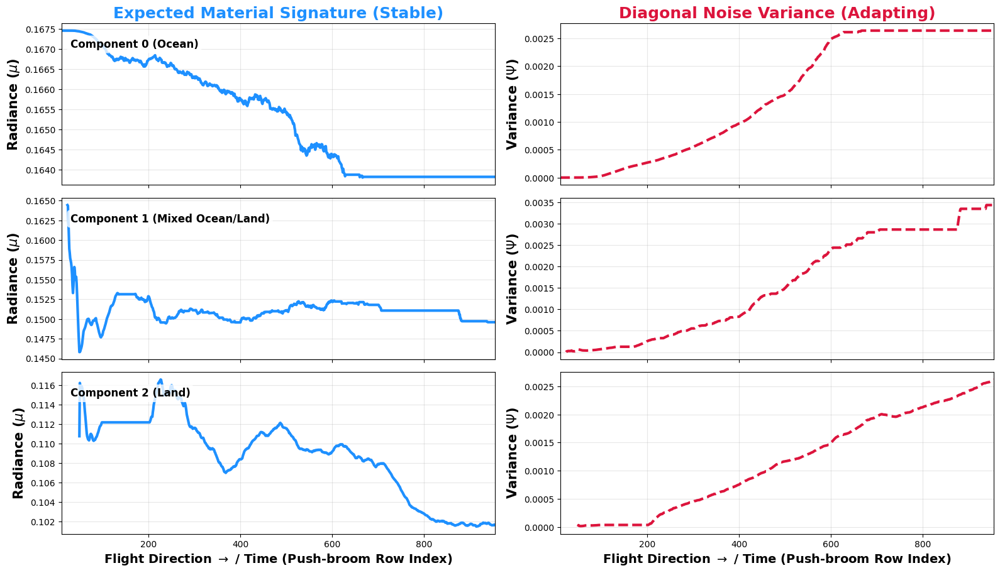

In [8]:
import numpy as np
import matplotlib.pyplot as plt

print("--- GENERATING FIGURE: PARAMETER DECOUPLING (3x2 MATRIX) ---")

target_band = 10 

# --- Figure Setup ---
# 3 rows (for components), 2 columns (Mu vs Psi)
fig, axes = plt.subplots(3, 2, figsize=(16, 10), sharex=True)

component_names = ["Component 0 (Ocean)", "Component 1 (Mixed Ocean/Land)", "Component 2 (Land)"]

for i in range(3):
    ax_mu = axes[i, 0]   # Left column
    ax_psi = axes[i, 1]  # Right column
    
    mu_track = mu_history[i] 
    psi_track = psi_history[i] 
    
    # --- LEFT COLUMN: Expected Radiance (Mu) ---
    ax_mu.plot(time_steps, mu_track, color='dodgerblue', linewidth=3)
    ax_mu.set_ylabel(r"Radiance ($\mu$)", fontsize=15, fontweight='bold')
    ax_mu.grid(True, alpha=0.3)
    
    # Place a clean text box inside the plot to label the component
    ax_mu.text(0.02, 0.85, component_names[i], transform=ax_mu.transAxes, 
               fontsize=12, fontweight='bold', 
               bbox=dict(facecolor='white', alpha=0.8, edgecolor='none', boxstyle='round,pad=0.3'))

    # --- RIGHT COLUMN: Sensor Variance (Psi) ---
    ax_psi.plot(time_steps, psi_track, color='crimson', linewidth=3, linestyle='--')
    ax_psi.set_ylabel(r"Variance ($\Psi$)", fontsize=15, fontweight='bold')
    ax_psi.grid(True, alpha=0.3)
    
    # Add column titles on the top row only
    if i == 0:
        ax_mu.set_title(r"Expected Material Signature (Stable)", fontsize=18, fontweight='bold', color='dodgerblue')
        ax_psi.set_title(r"Diagonal Noise Variance (Adapting)", fontsize=18, fontweight='bold', color='crimson')

# Format the X-axes (only needed on the bottom row because of sharex=True)
axes[2, 0].set_xlabel("Flight Direction $\\rightarrow$ / Time (Push-broom Row Index)", fontsize=14, fontweight='bold')
axes[2, 1].set_xlabel("Flight Direction $\\rightarrow$ / Time (Push-broom Row Index)", fontsize=14, fontweight='bold')

# Set strict limits
axes[0, 0].set_xlim(time_steps[0], time_steps[-1])

plt.tight_layout()
fig.subplots_adjust(top=0.88, wspace=0.15) # wspace controls the gap between columns
plt.savefig("figures/noise_drift_parameter_decoupling.pdf", format="pdf", bbox_inches="tight")
plt.show()

# Plotting the final \mu for each class

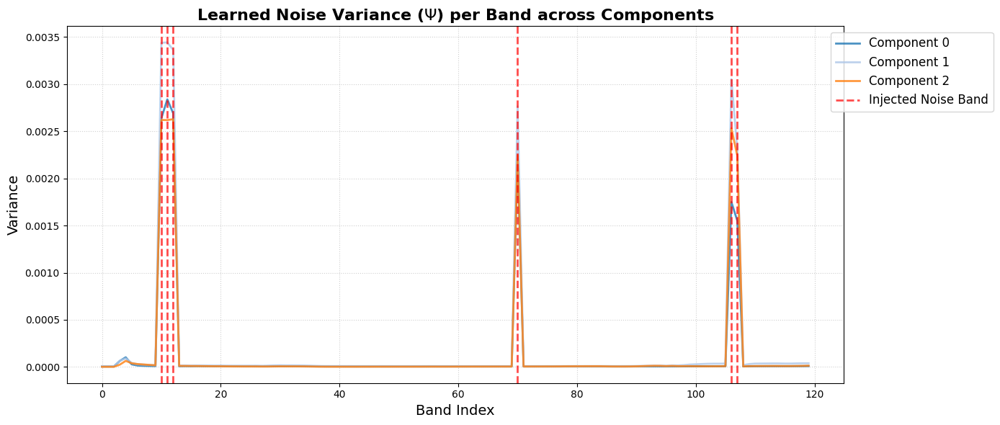

In [9]:
log_psi = adaptive_online_MFA.MFA.log_psi
psi = torch.exp(log_psi)

# 1. Convert PyTorch tensor to numpy array safely
if isinstance(psi, torch.Tensor):
    psi_np = psi.detach().cpu().numpy()
else:
    psi_np = np.array(psi)
    
K, D = psi_np.shape

# 2. Setup Figure
fig, ax = plt.subplots(figsize=(14, 6))

# 3. Plot the noise variance for each component
cmap = plt.get_cmap("tab20")
for k in range(K):
    # Match the color index styling from your previous plots
    color = cmap(k % 20) 
    ax.plot(range(D), psi_np[k, :], color=color, label=f'Component {k}', alpha=0.8, linewidth=2)
    
# 4. Draw vertical lines for injected noise bands
if BANDS_TO_DEGRADE:
    for idx, band in enumerate(BANDS_TO_DEGRADE):
        # Only label the first line to keep the legend clean
        lbl = "Injected Noise Band" if idx == 0 else None
        ax.axvline(x=band, color='red', linestyle='--', linewidth=2, alpha=0.7, label=lbl)
    
# 5. Polish and Labels
ax.set_title(r"Learned Noise Variance ($\Psi$) per Band across Components", fontsize=16, fontweight='bold')
ax.set_xlabel("Band Index", fontsize=14)
ax.set_ylabel("Variance", fontsize=14)
ax.grid(True, linestyle=':', alpha=0.6)

# Place legend outside the plot so it doesn't overlap the data
ax.legend(loc='upper right', bbox_to_anchor=(1.20, 1.0), fontsize=12)

plt.tight_layout()
plt.show()

### likelyhood-plot

Running full image inference (Model Frozen)...
Inference complete. Plotting Absolute Likelihood Heatmaps for 3 components...


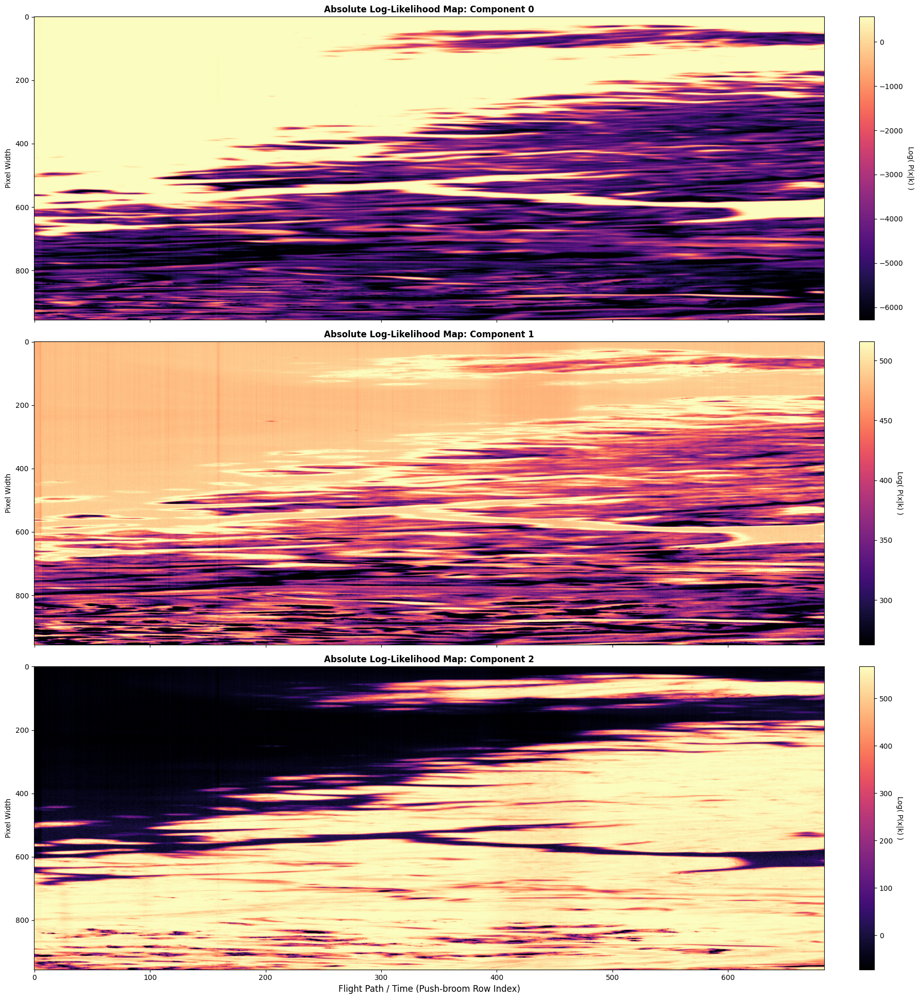

In [ ]:
# 1. Prepare the entire image as a single tensor
h_full, w_full, d = img_full_degraded.shape
full_tensor = torch.tensor(img_full_degraded.reshape(-1, d), dtype=torch.float32).to(device)

print("Running full image inference (Model Frozen)...")
with torch.no_grad():
    # FIX: Apply L2 Normalization before evaluating!
    if adaptive_online_MFA.L2_normalization:
        full_tensor = torch.nn.functional.normalize(full_tensor, p=2, dim=1)
        
    # Unpack log_probs instead of just log_resp_norm
    log_resp_norm, _, log_probs, mahalanobis_dists = adaptive_online_MFA.MFA.e_step(X=full_tensor)
    assignments = torch.argmax(log_resp_norm, dim=1)

# --- THE FIX ---
# Dynamically fetch the actual number of components from the model being used
actual_k = adaptive_online_MFA.MFA.K  
# ---------------

# 3. Reshape the absolute Log-Likelihoods
log_probs_np = log_probs.cpu().numpy()
likelihood_map = log_probs_np.reshape(h_full, w_full, actual_k)

print(f"Inference complete. Plotting Absolute Likelihood Heatmaps for {actual_k} components...")

# 4. Create a dedicated plot for the Absolute Likelihoods
if actual_k > 0:
    fig, axes = plt.subplots(actual_k, 1, figsize=(18, 6.5 * actual_k), sharex=True)
    if actual_k == 1: axes = [axes]
        
    for k in range(actual_k):
        ax = axes[k]
        
        # Extract the 2D Absolute Log-Likelihood map for this component
        likelihood_2d = likelihood_map[:, :, k]
        
        # Plot using an un-bounded color scale (vmin/vmax removed)
        # Use robust percentiles to stretch the contrast nicely
        p5, p95 = np.percentile(likelihood_2d, (5, 95))
        im = ax.imshow(likelihood_2d.T, cmap='magma', aspect='auto', vmin=p5, vmax=p95)
        
        ax.set_title(f"Absolute Log-Likelihood Map: Component {k}", fontsize=12, fontweight='bold')
        ax.set_ylabel("Pixel Width")
        
        cbar = fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
        cbar.set_label('Log( P(x|k) )', rotation=270, labelpad=15)

    axes[-1].set_xlabel("Flight Path / Time (Push-broom Row Index)", fontsize=12)
    plt.tight_layout()
    plt.show()

### Debugging plot

--- GENERATING MAHALANOBIS DISTANCE HEATMAP ---


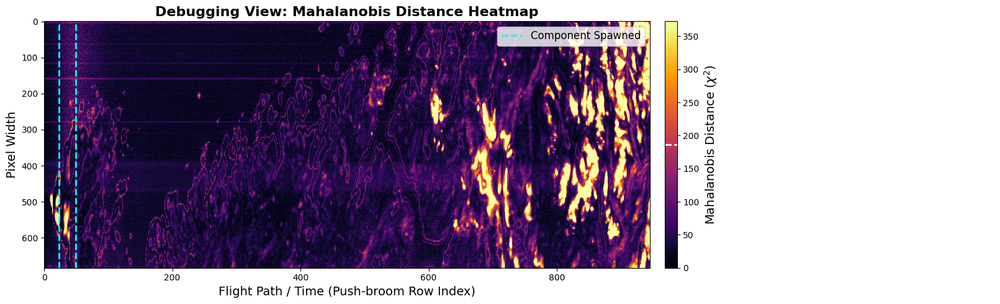

In [ ]:
print("--- GENERATING MAHALANOBIS DISTANCE HEATMAP ---")

# --- 1. Preparation ---
# Fetch the threshold from the model to draw the "anomaly shoreline"
threshold = adaptive_online_MFA.chi2_threshold

# Cap the maximum visual value at 2x the threshold to match your style
vmax_heat = threshold * 2 

# --- 2. Figure Setup ---
fig, ax = plt.subplots(figsize=(16, 5))

# Transpose the map (.T) and apply the 'inferno' colormap
cax = ax.imshow(mahalanobis_map.T, aspect='auto', cmap='inferno', vmin=0, vmax=vmax_heat, interpolation='nearest')

# --- 3. Draw the Anomaly Shoreline (Contour) ---
x_range = np.arange(N_TRAIN_ROWS, N_TRAIN_ROWS + h)
y_range = np.arange(0, w)
X_grid, Y_grid = np.meshgrid(x_range, y_range)

# --- 4. Colorbar Formatting ---
cbar = fig.colorbar(cax, ax=ax, pad=0.02)
cbar.set_label(r'Mahalanobis Distance ($\chi^2$)', fontsize=14)

# Draw a white line on the colorbar to mark the threshold limit
cbar.ax.axhline(threshold, color='white', linestyle='--', linewidth=2)
cbar.ax.text(vmax_heat * 0.05, threshold + (vmax_heat * 0.05), 'Anomaly Threshold', 
             color='white', fontsize=12, va='bottom')

# --- 5. Polish and Labels ---
ax.set_title("Debugging View: Mahalanobis Distance Heatmap", fontsize=16, fontweight='bold')
ax.set_xlabel("Flight Path / Time (Push-broom Row Index)", fontsize=14)
ax.set_ylabel("Pixel Width", fontsize=14)

# FIX: Loop through all spawn rows using your requested style
if 'spawn_rows' in locals() and len(spawn_rows) > 0:
    for i, s_row in enumerate(spawn_rows):
        lbl = "Component Spawned" if i == 0 else None
        ax.axvline(x=N_TRAIN_ROWS + s_row, color='cyan', linestyle='--', linewidth=2, label=lbl)
    ax.legend(loc="upper right", fontsize=12)

plt.tight_layout()
plt.show()